# Consistent AI Image Generation

### Project Overview
---
This notebook is part of a multi-part project that compares different approaches to consistent AI image generation.

The methods for consistent AI image generation used are:
- **Method 1:** Image-to-Image Generation Using a Base Image
- **Method 2:** Fine-tuning SD1.5 with similar images until it generates somewhat consistently

You can refer to the [README](https://github.com/angusleung100/AI-Generated-Catgirls-SD) for more background on this project.

### Fine-Tuning SD1.5 through Dreambooth
---
Dreambooth is a method to train Stable Diffusion on a smaller amount of images and still produce a decent checkpoint for image generation. Based on the [Dreambooth website](https://dreambooth.github.io/), it looks quite promising so we have decided to use it for its lower resource usage compared to finetuning directly on the SD1.5 model we picked out.


In [1]:
# Import prequisites
!pip install transformers diffusers accelerate torch numpy safetensors IPython pandas datasets==2.10.0

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl.metadata (1.8 kB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinu

In [2]:
# Import prerequisites
import os
import torch
import numpy as np
import pandas as pd

from transformers import CLIPProcessor, Pipeline
from datasets import Dataset
from diffusers import StableDiffusionPipeline, DiffusionPipeline, DDIMScheduler, LMSDiscreteScheduler, PNDMScheduler, EulerAncestralDiscreteScheduler, EulerDiscreteScheduler, DPMSolverMultistepScheduler
from diffusers.utils import load_image, make_image_grid
from safetensors.torch import load_file
from IPython.display import Image, display
from PIL import Image
from google.colab import userdata, drive

In [3]:
# Script Configuration
drive.mount('/content/drive')

base_directory = "/content/drive/My Drive/AI Consistent Generation/Fine-Tune/"

civitai_token = ""  # Civitai API token

hf_token = userdata.get('hf_token') # Hugging Face auth token read/write

# Load a checkpoint downloaded from Civitai (brav5 or brav7)
base_checkpoint = "brav6"

# Load a checkpoint from Hugging Face
#base_checkpoint = "https://huggingface.co/WarriorMama777/OrangeMixs/blob/main/Models/AbyssOrangeMix/AbyssOrangeMix.safetensors" # From model link
#base_checkpoint = "runwayml/stable-diffusion-v1-5" # From model name


Mounted at /content/drive


In [4]:
# Download checkpoint from Civitai

#!curl -L -o brav7.safetensors https://civitai.com/api/download/models/177164  # BRA V7
!curl -L -o brav6.safetensors https://civitai.com/api/download/models/113479  # BRA V6
#!curl -L -o brav5.safetensors https://civitai.com/api/download/models/63786  # BRA V5

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   502    0   502    0     0   1074      0 --:--:-- --:--:-- --:--:--  1074
100 2033M  100 2033M    0     0  76.8M      0  0:00:26  0:00:26 --:--:-- 91.5M


### Load Base Model
---

In [5]:
# Load weights from Hugging Face
#pipeline = StableDiffusionPipeline.from_single_file(base_checkpoint, token=hf_token)

# Load weights from Civitai
pipeline = StableDiffusionPipeline.from_single_file(base_checkpoint+".safetensors", token=hf_token, use_safetensors=True, torch_dtype=torch.float16, local_files_only=True)

# Move the pipeline to the GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
pipeline.to(device)

`local_files_only` is True but no local configs were found for this checkpoint.
Attempting to download the necessary config files for this pipeline.



Fetching 11 files:   0%|          | 0/11 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Some weights of the model checkpoint were not used when initializing CLIPTextModel: 
 ['text_model.embeddings.position_ids']
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


StableDiffusionPipeline {
  "_class_name": "StableDiffusionPipeline",
  "_diffusers_version": "0.30.0",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "image_encoder": [
    null,
    null
  ],
  "requires_safety_checker": true,
  "safety_checker": [
    null,
    null
  ],
  "scheduler": [
    "diffusers",
    "PNDMScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

### Load Textual Inversions
---

In [6]:
# Bad anatomy
!curl -L -o bad_NegAnatomy.pt https://civitai.com/api/download/models/64063 # https://civitai.com/models/59614/badneganatomy-textual-inversion
!curl -L -o Deep_NegativeV1.pt https://civitai.com/api/download/models/5637 # https://civitai.com/models/4629/deep-negative-v1x
!curl -L -o Bad_Hands4.pt https://civitai.com/api/download/models/20068 # https://civitai.com/models/16993/badhandv4
!curl -L -o Perfect_Asian_Face.pt https://civitai.com/api/download/models/24904 # https://civitai.com/models/20918/perfect-asian-facev1
!curl -L -o Unrealistic_Dream.pt https://civitai.com/api/download/models/77173 # https://civitai.com/models/72437?modelVersionId=77173
!curl -L -o Bad_Dream.pt https://civitai.com/api/download/models/77169 # https://civitai.com/models/72437?modelVersionId=77169

textual_inversions = ['bad_NegAnatomy.pt', 'Deep_NegativeV1.pt', 'Bad_Hands4.pt', 'Perfect_Asian_Face.pt', 'Unrealistic_Dream.pt', 'Bad_Dream.pt']

for ti in textual_inversions:
  pipeline.load_textual_inversion(ti, local_files_only=True)

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   488    0   488    0     0    373      0 --:--:--  0:00:01 --:--:--   372
100  210k  100  210k    0     0   130k      0  0:00:01  0:00:01 --:--:--  130k
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   494    0   494    0     0    494      0 --:--:-- --:--:-- --:--:--   494
100  225k  100  225k    0     0   168k      0  0:00:01  0:00:01 --:--:--  168k
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   472    0   472    0     0    639      0 --:--:-- --:--:-- --:--:--   638
100 19371  100 19371    0     0  18371      0  0:00:01  0:00:01 --:--:-- 18371
  % Total    % Received % Xferd  Average Speed   Tim

### Generation Config
---
We are keeping the same generation configuration as the Method 1 notebook as we want to keep somewhat consistent characters for comparison later on.

In [40]:
config = {
  'num_inference_steps': 20,
  'strength': 0.8,
  'guidance_scale': 5,
  'num_images_per_prompt': 5, # Max images per prompt for T4 is around 5-10
  'height': 512,
  'width': 512,
  'seed': 1956570117,
  'scheduler': "DPMSolverMultistepScheduler_karras"
}

torch.manual_seed(config['seed'])

positive_prompt = """masterpiece, hyper-detailed, professional, iPhone 15 Pro, high-res, portrait shot, realistic skin, super detailed skin, white dress, white patterned dress, looking at camera, standing in busy street, blurred background, full body, detailed beautiful face and eyes, Korean girl, kpop idol, long hair, black hair, brown eyes"""

negative_prompt = """watermark, logo, paintings, sketches, (worst_quality:2), (low quality:2), (normal quality:2), lowres, normal quality, ((monochrome)), ((grayscale)), pixelated, deformed, ugly, bad-hands-5 easynegative verybadimagenegative_v1.3 UnrealisticDream"""

### Reused Functions Used for Fine-Tuning Script
---
Some of the functions from Method 1 are reused because they are trivial and are genuinely helpful in making the code readable. Also some of the functions for generation are reused since... we need to generate images first anyways.

In [8]:
# Set save directory
def create_save_dir(target_directory):

  if not os.path.exists(base_directory+target_directory):  # Make directory if not exists
    os.makedirs(base_directory+target_directory)
    print("Created save directory")
  else:
    print("Directory already exists")

  return target_directory

# Save generation settings
def create_generation_settings_file(file_label):
  try:
    with open(base_directory+"/generation_settings_"+file_label+".txt", "x") as f:
      f.write("Seed: "+str(config['seed'])+"\nPositive Prompt: "+positive_prompt+"\nNegative Prompt: "+negative_prompt+"\n")
      f.write("Base Image: "+str(None)+"\nNum Inference Steps: "+str(config['num_inference_steps'])+"\nStrength: "+str(config['strength'])+"\n")
      f.write("Images Per Batch: "+str(config['num_images_per_prompt'])+"\nNumber of Batches: "+str(batch_count)+"\nTotal Images: "+str(config['num_images_per_prompt']*batch_count)+"\n")
      f.write("Guidance Scale: "+str(config['guidance_scale'])+"\nTextual Inversions Used: "+str(textual_inversions)+"\nScheduler Used: "+str(config['scheduler'])+"\n")

  except:
    with open(base_directory+"/generation_settings_"+file_label+".txt", "w") as f:
      f.write("Seed: "+str(config['seed'])+"\nPositive Prompt: "+positive_prompt+"\nNegative Prompt: "+negative_prompt+"\n")
      f.write("Base Image: "+str(None)+"\nNum Inference Steps: "+str(config['num_inference_steps'])+"\nStrength: "+str(config['strength'])+"\n")
      f.write("Images Per Batch: "+str(config['num_images_per_prompt'])+"\nNumber of Batches: "+str(batch_count)+"\nTotal Images: "+str(config['num_images_per_prompt']*batch_count)+"\n")
      f.write("Guidance Scale: "+str(config['guidance_scale'])+"\nTextual Inversions Used: "+str(textual_inversions)+"\nScheduler Used: "+str(config['scheduler'])+"\n")

  print("Generation settings text file", file_label, "created successfully")

# Generation Function
def generate(config, base_image, positive_prompt, negative_prompt):

  # Load scheduler
  if config['scheduler'] == "DDIMScheduler":
    pipeline.scheduler = DDIMScheduler.from_config(pipeline.scheduler.config)
  elif config['scheduler'] == "LMSDiscreteScheduler":
    pipeline.scheduler = LMSDiscreteScheduler.from_config(pipeline.scheduler.config)
  elif config['scheduler'] == "EulerAncestralDiscreteScheduler":
    pipeline.scheduler = EulerAncestralDiscreteScheduler.from_config(pipeline.scheduler.config)
  elif config['scheduler'] == "EulerDiscreteScheduler":
    pipeline.scheduler = EulerDiscreteScheduler.from_config(pipeline.scheduler.config)
  elif config['scheduler'] == "DPMSolverMultistepScheduler":
    pipeline.scheduler = DPMSolverMultistepScheduler.from_config(pipeline.scheduler.config)
  elif config['scheduler'] == "DPMSolverMultistepScheduler_karras":
    pipeline.scheduler = DPMSolverMultistepScheduler.from_config(pipeline.scheduler.config, use_karras_sigmas=True)
  else:
    pipeline.scheduler = PNDMScheduler.from_config(pipeline.scheduler.config)

    # Note: By default it is PNDMS scheduler
  return pipeline(prompt=positive_prompt, negative_prompt=negative_prompt, init_image=base_image, width=config['width'], height=config['height'], num_images_per_prompt=config['num_images_per_prompt'], num_inference_steps=config['num_inference_steps'], guidance_scale=config['guidance_scale'])


In [ ]:
folder_name = "images" # Name of the folder to put output into
save_directory = create_save_dir(folder_name)
save_directory

Created save directory


'images'

# Fine-Tuning With Generated Images
---

Images generated from the current checkpoint are used to fine-tune on. Dreambooth apparently only needs around 10 images to train on somewhat successfully.

A keyword or several keywords are used to label the images and feed it back into the model.

In theory, if we associate the name with images enough, it should give a somewhat consistent character generation, which is a merge of all the images being fine-tuned on.


Note: I debated whether to name the character with a single name or multi-part name for tokenization reasons.

Tokenization of the generation prompt might split a multi-part name in unexpected ways, depending how I word the prompt.

For example, if I name the AI character "Astoria Lee" and the tokenizer doesn't understand that Astoria and Lee are together as a name, it could somehow generate an ocean if no proper connection is made by the model that Ocean Kang is a name and not 2 separate words with different context.

However, it would be more identifiable by the system's tokenizer in theory if I insist the character it is fine-tuning on is that person. The model could consider Astoria Lee an actual character to associate with brown hair and human ears.

A single name might be better, but the system might get confused if the name has multiple meanings, such as Candy or Jade. Similar to the multi-part name, it's all down to how the model interprets the prompt.

Below we see the model tokenizer splits the name up into 2 words:

In [9]:
from transformers import AutoTokenizer

tokenizer = pipeline.tokenizer

tokens = tokenizer.convert_ids_to_tokens(tokenizer("Astoria Lee")['input_ids'])
print("Astoria Lee:",tokens)

tokens = tokenizer.convert_ids_to_tokens(tokenizer("Astoria-Lee")['input_ids'])
print("Astoria-Lee:",tokens)

tokens = tokenizer.convert_ids_to_tokens(tokenizer("Astoria")['input_ids'])
print("Astoria:",tokens)

Astoria Lee: ['<|startoftext|>', 'astoria</w>', 'lee</w>', '<|endoftext|>']
Astoria-Lee: ['<|startoftext|>', 'astoria</w>', '-</w>', 'lee</w>', '<|endoftext|>']
Astoria: ['<|startoftext|>', 'astoria</w>', '<|endoftext|>']


While we don't dive into exactly how the model will determine context for this model in this script, we do see the split as a potential issue without explicitly training the model to accept it as a name.

**Dreambooth Note:** Dreambooth training associates some kind of prompt or keywords to the training images, so they can be associated and factored into the generation.

### Setting Up Batch Image Generation Function With Image ID Cursor
---
Modifying the original batch generation cell, we have a global ```img_id``` variable to keep track of what image the pipeline is generating to prevent overwriting a generated image.

The images need to be kept so they can be fed back into the model for fine-tuning

In [9]:


character_name = "Astoria-Lee"  # Selected label name for character

As stated before, we should probably come up with a name to associate with the character we generate. I was not sure whether it would be better to have a dash or not so I added a dash just in case.

### Modified version of the bulk generation to have all the images in one folder
---

In [48]:
def batch_generate(batches_to_generate, save_directory):

  global img_id # Used as cursor for current image id label

  img_id = 1  # Image ID cursor (Used to generate images and avoid overwriting)

  print("Batch Generation Started")

  print("Total Generated Images For Function Call: ", str(config['num_images_per_prompt']*batches_to_generate))


  # Generate multiple batches

  for i in range(batches_to_generate):  # Batch
    print("Generating Batch ", str(i+1))

    result = generate(config, None, positive_prompt, negative_prompt)

    for img in result.images:

      img.save(base_directory+save_directory+"/"+character_name+"("+str(img_id)+").png")  # Naming convention of Character (X).png to comply with Fast Dreambooth Script
      img_id += 1

  print("Batch Generation Complete")

### Initial Batch Generation
---
Always generate more than enough to so you can sort through and determine which are the most usable ones.

In [ ]:
batch_generate(4, save_directory) # Generate 20

Batch Generation Started
Total Generated Images For Function Call:  20
Generating Batch  1


  0%|          | 0/20 [00:00<?, ?it/s]

Generating Batch  2


  0%|          | 0/20 [00:00<?, ?it/s]

Generating Batch  3


  0%|          | 0/20 [00:00<?, ?it/s]

Generating Batch  4


  0%|          | 0/20 [00:00<?, ?it/s]

Batch Generation Complete


### Display A few Generated Training Batch Images
---

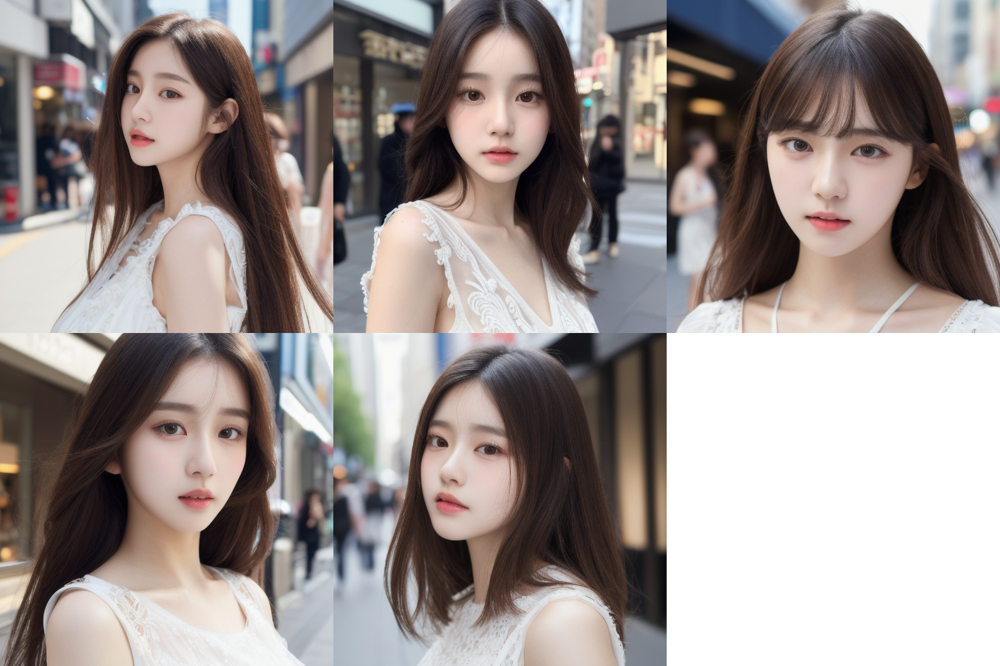

In [ ]:
image_names = os.listdir(base_directory+save_directory)

number_to_display = 5 # Number of images to display

img_num = 0

images_to_display = []

for img in image_names:

  if img_num == number_to_display:
    break

  if ".txt" in img:
    continue
  else:
    images_to_display.append(Image.open(base_directory+save_directory+"/"+img))

images_to_display.append(Image.new('RGB', (512, 512), color=(255, 255, 255))) # Add blank image to meet 3x2 grid requirements

make_image_grid(images_to_display, rows=2, cols=3)

So far the images look quite similar, with brown hair, brown eyes, and similar facial features.

We kept the seed the same and the overall generation settings the same, which should result in similar characters for all generations

The addition of the textual inversions for correcting anatomy issues seems to be working so far. Let's continue building out our algorithm!

## Filter Out Bad Anatomy
---
Our generations are not perfect, so we have to sort out the ones with bad anatomy.

I created the BARC model for this, which is a Bad Anatomy Realism Classifier. It has a 60% accuracy, which is absolutely terrible but hey, it helps a lot if you have like 50+ images to sort through and like 10+ training sessions on the model to do.

BARC: https://huggingface.co/angusleung100/bad-anatomy-realism-classifier

However, since I only have 20 to sort through, I can just do it manually.

### Diffusers Txt2Img ~~Training Script~~ Steps
---
Unlike the ```Trainer``` class in Transformers, Diffusion models are trained a bit differently it seems and require extra preprocessing and resources to successfully fine-tune.

Based on documentation, it seems the Trainer class in Transformers and the Diffusers library both do not have a built-in training function for Diffusion models. So we need to create one or be creative.

I could not find a way to train on a single environment due to package conflicts on pip so I have decided to mix in some manual labour on Dreambooth to train:

There is a training session for every 10 images, I will then upload the model to Hugging Face. You can then see the different stages of the model through the version control.

[TheLastBen](https://github.com/TheLastBen/) has created an awesome Notebook for Dreambooth training so we don't have to reinvent the wheel. Check it out below:

**Note:** Dreambooth requires at least 12GB of VRAM to run and even a Tesla T4 is very slow to train on. I recommend a V100 for faster training.

Ref: https://github.com/TheLastBen/fast-stable-diffusion



### Training Dreambooth Steps
---
Below is the list of steps we are using for training the Dreambooth model:
1. Load our base model
2. Generate images and pick out 10 we like
3. Load into Dreambooth and start training
4. Test and save model to Hugging Face
5. Load Dreambooth model that we trained
6. Repeat steps 2 to 5 until you are satisfied with the model's consistent generation attempts



## Training
---
Go to your Dreambooth script and train on the 10 images. Then execute the cell below to reload the new model into this Notebook:

In [11]:
# Load weights from Hugging Face
hf_dreambooth_checkpoint = "angusleung100/astoria-db" # I made mine a public checkpoint but you can use a local checkpoint too

pipeline = DiffusionPipeline.from_pretrained(hf_dreambooth_checkpoint, token=hf_token, torch_dtype=torch.float16)

# Move the pipeline to the GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
pipeline.to(device)

# Bad anatomy Embeddings
textual_inversions = ['bad_NegAnatomy.pt', 'Deep_NegativeV1.pt', 'Bad_Hands4.pt', 'Perfect_Asian_Face.pt', 'Unrealistic_Dream.pt', 'Bad_Dream.pt']

for ti in textual_inversions:
  pipeline.load_textual_inversion(ti, local_files_only=True)

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors not found


Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/465 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/246M [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.27k [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/641 [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

An error occurred while trying to fetch /root/.cache/huggingface/hub/models--angusleung100--astoria-db/snapshots/fc2d5c2cd6009b35de33cea117a4b5b5f71ca6ff/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--angusleung100--astoria-db/snapshots/fc2d5c2cd6009b35de33cea117a4b5b5f71ca6ff/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurred while trying to fetch /root/.cache/huggingface/hub/models--angusleung100--astoria-db/snapshots/fc2d5c2cd6009b35de33cea117a4b5b5f71ca6ff/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--angusleung100--astoria-db/snapshots/fc2d5c2cd6009b35de33cea117a4b5b5f71ca6ff/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


### Generate images and pick out the ones we like
---
Run the below cell to generate images and sort them into a separate folder (Ex: Iteration-1, Iteration-2) for each training session.

Then run the Dreambooth training on the folder with the proper naming convention

Note: We have to adjust the positive prompt to include our Dreambooth character too

In [41]:
# Change global positive prompt to include Astoria-Lee as the Dreambooth keyword
positive_prompt = """masterpiece, hyper-detailed, professional, iPhone 15 Pro, high-res, portrait shot, realistic skin, super detailed skin, white dress, white patterned dress, looking at camera, standing in busy street, blurred background, full body, detailed beautiful face and eyes, Astoria-Lee, Korean girl, kpop idol, long hair, black hair, brown eyes"""

In [42]:
# Generate a batch of images for testing

base_images_dir = "images-1"

create_save_dir(base_images_dir)  # Change name of folder for each new session of training

batch_generate(4, base_images_dir)  # Generate 20 test images from newly finetuned checkpoint

Directory already exists
Batch Generation Started
Total Generated Images For Function Call:  20
Generating Batch  1


  0%|          | 0/20 [00:00<?, ?it/s]

Generating Batch  2


  0%|          | 0/20 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


Generating Batch  3


  0%|          | 0/20 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


Generating Batch  4


  0%|          | 0/20 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


Batch Generation Complete


I usually just have a separate folder that says "Iteration-1" and so on in the same directory so it looks like this:

```
Drive
- AI Consistent Generation
  - Fine-Tune
    - Images
    - Iteration-1
    - Iteration-2
    ...
```

But as long as you can figure out where the images are for your training, should be fine

## Side Test
---
I decided to check the generations from the trained model and it seems to be generating a consistent face, which is great.

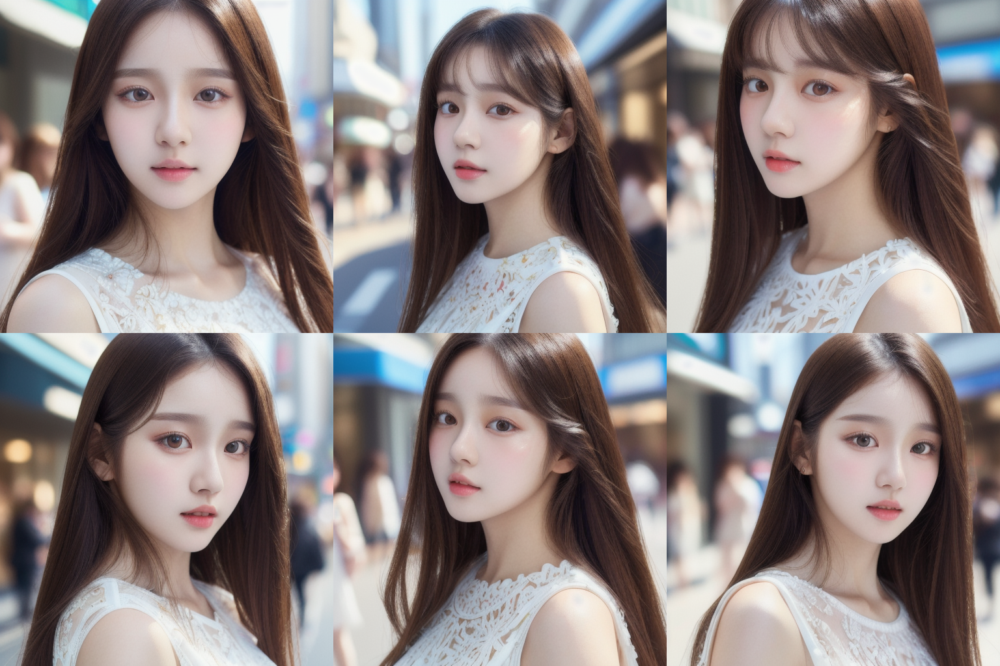

In [43]:
image_names = os.listdir(base_directory+"/images-1/")

number_to_display = 6 # Number of images to display

img_num = 0

images_to_display = []

for img in image_names:

  if img_num == number_to_display:
    break

  if ".txt" in img:
    continue
  else:
    images_to_display.append(Image.open(base_directory+"/images-1/"+img))
    img_num += 1

make_image_grid(images_to_display, rows=2, cols=3)

However, I noticed that the eyebrows are very rectangular, so we should adjust the negative prompt and see if we can generate some different less rectangular eyebrows.

In [44]:
negative_prompt = """watermark, logo, bushy eyebrows, hairy eyebrows, rectangular eyebrows, (worst_quality:2), (low quality:2), (normal quality:2), lowres, normal quality, ((monochrome)), ((grayscale)), pixelated, deformed, ugly, bad-hands-5 easynegative verybadimagenegative_v1.3 UnrealisticDream"""

In [49]:
# Generate a batch of images for testing

base_images_dir = "images-1"

create_save_dir(base_images_dir)  # Change name of folder for each new session of training

batch_generate(4, base_images_dir)  # Generate 20 test images from newly finetuned checkpoint

Directory already exists
Batch Generation Started
Total Generated Images For Function Call:  20
Generating Batch  1


  0%|          | 0/20 [00:00<?, ?it/s]

Generating Batch  2


  0%|          | 0/20 [00:00<?, ?it/s]

Generating Batch  3


  0%|          | 0/20 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


Generating Batch  4


  0%|          | 0/20 [00:00<?, ?it/s]

Batch Generation Complete


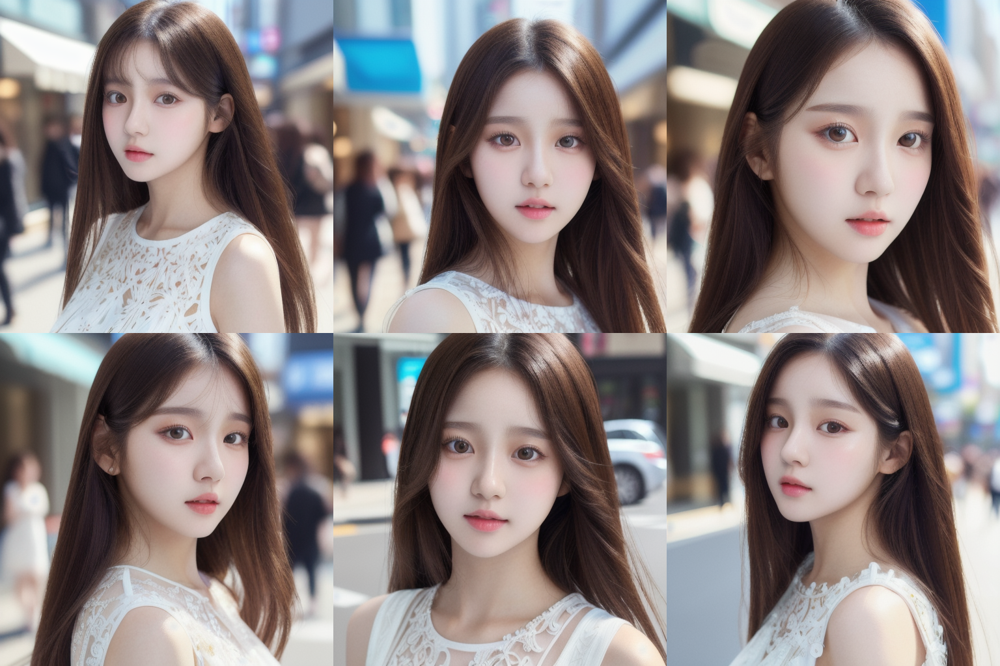

In [50]:
image_names = os.listdir(base_directory+"/images-1/")

number_to_display = 6 # Number of images to display

img_num = 0

images_to_display = []

for img in image_names:

  if img_num == number_to_display:
    break

  if ".txt" in img:
    continue
  else:
    images_to_display.append(Image.open(base_directory+"/images-1/"+img))
    img_num += 1

make_image_grid(images_to_display, rows=2, cols=3)

It got a bit better with the negative prompt to correct it. The sides that are closest to the middle of the face are no longer block-like. We can always just generate more and manually sort out the images we want as well.

**Note:** I was not expecting Dreambooth to train so well, but you can just use the previous few cells as a way to test your model you trained.

## Finishing Training Sessions
---
~~After repeating the previous 3 cells and running Dreambooth Notebook enough, you should have a model that is somewhat usable.~~

Dreambooth beat my expectation and was able to merge the faces together in one training session. We didn't need to redo the training session several times.

As you can see, we are achieving consistent faces!

Let's import it one final time and check what we are able to generate with a different prompt.

In [51]:
# Load weights from Hugging Face
hf_dreambooth_checkpoint = "angusleung100/astoria-db" # I made mine a public checkpoint but you can use a local checkpoint too

pipeline = DiffusionPipeline.from_pretrained(hf_dreambooth_checkpoint, token=hf_token, torch_dtype=torch.float16)

# Move the pipeline to the GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
pipeline.to(device)

# Bad anatomy Embeddings
textual_inversions = ['bad_NegAnatomy.pt', 'Deep_NegativeV1.pt', 'Bad_Hands4.pt', 'Perfect_Asian_Face.pt', 'Unrealistic_Dream.pt', 'Bad_Dream.pt']

for ti in textual_inversions:
  pipeline.load_textual_inversion(ti, local_files_only=True)

unet/diffusion_pytorch_model.safetensors not found


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

An error occurred while trying to fetch /root/.cache/huggingface/hub/models--angusleung100--astoria-db/snapshots/fc2d5c2cd6009b35de33cea117a4b5b5f71ca6ff/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--angusleung100--astoria-db/snapshots/fc2d5c2cd6009b35de33cea117a4b5b5f71ca6ff/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurred while trying to fetch /root/.cache/huggingface/hub/models--angusleung100--astoria-db/snapshots/fc2d5c2cd6009b35de33cea117a4b5b5f71ca6ff/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--angusleung100--astoria-db/snapshots/fc2d5c2cd6009b35de33cea117a4b5b5f71ca6ff/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


**Remember:** Our negative prompt was changed, so the ``generate()`` below will be using the adjusted ``negative_prompt`` that fixed the eyebrow issue.

In [55]:
# Generate some sample images

# Change global positive prompt to include Astoria-Lee as the Dreambooth keyword
positive_prompt = """Astoria-Lee, Korean girl, kpop idol, standing in front of a convenient store near the base of Mount Fuji, light blue hoodie, hoodie, masterpiece, hyper-detailed, professional, iPhone 15 Pro, high-res, portrait shot, realistic skin, super detailed skin, looking at camera, blurred background, full body, detailed beautiful face and eyes, long hair, black hair, brown eyes"""


db_results = generate(config, None, positive_prompt, negative_prompt) # 5 images are generated per prompt

result_i = 0

create_save_dir("results")

for img in db_results.images:

      img.save(base_directory+"results/"+character_name+"("+str(result_i)+").png")  # Naming convention of Character (X).png to comply with Fast Dreambooth Script
      result_i += 1

Token indices sequence length is longer than the specified maximum sequence length for this model (83 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', black hair, brown eyes']


  0%|          | 0/20 [00:00<?, ?it/s]

Directory already exists


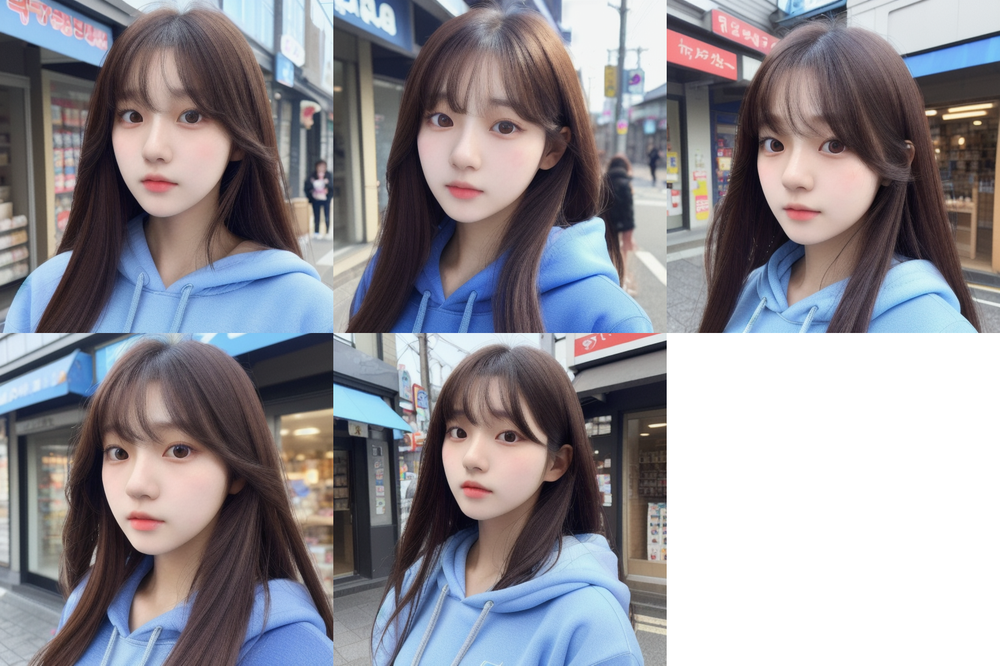

In [59]:
image_names = os.listdir(base_directory+"/results/")

number_to_display = 5 # Number of images to display

img_num = 0

images_to_display = []

for img in image_names:

  if img_num == number_to_display:
    break

  if ".txt" in img:
    continue
  else:
    images_to_display.append(Image.open(base_directory+"/results/"+img))
    img_num += 1

images_to_display.append(Image.new('RGB', (512, 512), color=(255, 255, 255))) # Add blank image to meet 3x2 grid requirements

make_image_grid(images_to_display, rows=2, cols=3)

Overall, the generations were accurate somewhat ot the prompt. Though I can't seem to find Mount Fuji anywhere in these images, we do have our character in a blue hoodie looking at the camera.

## Comparison With Model Base Character
---
Let's pull up a few images from the Dreambooth checkpoint and some from this new generation and see if the consistency persists.

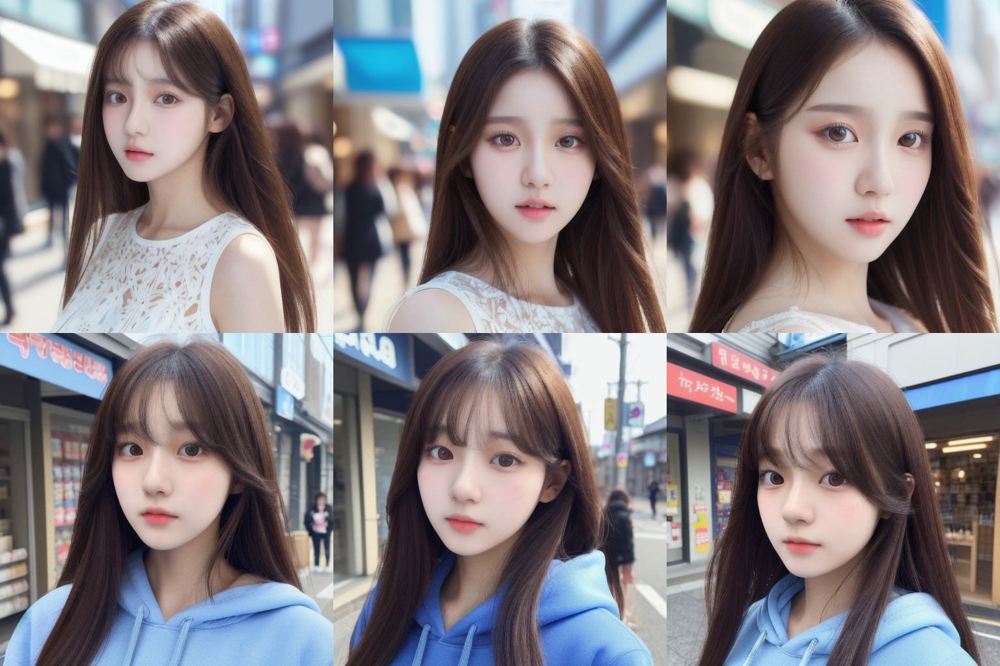

In [77]:
db_model_images = os.listdir(base_directory+"/images-1/")
new_prompt_images = os.listdir(base_directory+"/results/")

num_each_sample = 3 # Number of images to display

images_to_display = []

img_num = 0

# Get images from DB model test
for img in db_model_images:

  if img_num == num_each_sample:
    break

  if ".txt" in img:
    continue
  else:
    images_to_display.append(Image.open(base_directory+"/images-1/"+img))
    img_num += 1

img_num = 0 # Reset counter

# Get images from new test prompt results
for img in new_prompt_images:

  if img_num == num_each_sample:
    break

  if ".txt" in img:
    continue
  else:
    images_to_display.append(Image.open(base_directory+"/results/"+img))
    img_num += 1

make_image_grid(images_to_display, rows=2, cols=3)

**Top Row:** Dreambooth Model With Original Prompt

**Bottom Row:** Dreambooth Model With Modified / New Prompt

## Thoughts
---
I think that the Dreambooth model was quite successful in keeping the lips and nose somewhat consistent but did have trouble determining whether bangs should be used or not. Since the tokenizer did have to cut off the long black hair section of the prompt, I assume that is the contributing factor to why bangs were the default for the modified prompt's image generations.

## Summary / Note
---
Method 2 was originally supposed to be fine-tuning directly on the model, but due to technical issues and hardware limitations on my end, I decided to switch to a Dreambooth approach.

We were also supposed to fine-tune by feeding generated images back into the model and eventually converge the model's generations to become a somewhat consistent character.

Dreambooth was quite successful on training a model that would yield consistent character generation and I think we are set for Method 2.

We could have technically continued feeding in generated images and continued training the Dreambooth checkpoint but I don't anticipate that the checkpoint's training results would be much different if we did do several training sessions with the previous model's generated images.